In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
exam_df = pd.read_csv('combined_data_preprocessed_top25_14Jun24.csv')
oos_df = pd.read_csv('combined_data_preprocessed_top25_14Jun24_test.csv')

In [3]:
mapper_df = pd.read_csv('preprocessed_summary.csv')

In [4]:
exam_df.columns

Index(['Week', 'From', 'To', 'Return', 'moving_prc_dir', 'Text', 'TICKER',
       'keydevid', 'companyid', 'companyname', 'keydeveventtypeid',
       'eventtype', 'keydevtoobjectroletypeid', 'objectroletype',
       'announcedate', 'announcetime', 'announcedateTimeZone',
       'announceddateutc', 'enterdate', 'entertime', 'entereddateutc',
       'lastmodifieddate', 'lastmodifieddateutc', 'mostimportantdateutc',
       'speffectivedate', 'sptodate', 'gvkey', 'sourcetypename',
       'fri_of_week_x', 'next_fri_of_week', 'PERMCO', 'TICKER.1', 'COMNAM',
       'sum_log_RET_plus1', 'weekly_return_sign', 'previous_weekly_return',
       'moving_return', 'moving_return_dir', 'eow_adjusted_prc',
       'previous_eom_adjusted_prc', 'moving_prc', 'market_cap'],
      dtype='object')

In [5]:
exam_df[['companyname', 'COMNAM']].drop_duplicates()

,companyname,COMNAM
0,Enbridge Inc.,ENBRIDGE INC
6,NaN,ENBRIDGE INC
972,NaN,CHESAPEAKE ENERGY CORP
975,Chesapeake Energy Corporation,CHESAPEAKE ENERGY CORP
2161,NaN,AMERADA HESS CORP
2162,Hess Corporation,AMERADA HESS CORP
2246,Hess Corporation,HESS CORP
2252,NaN,HESS CORP
3078,Baker Hughes Holdings LLC,BAKER HUGHES INC
3080,NaN,BAKER HUGHES INC


In [6]:
selected_cols = ['Week', 'From', 'To', 'Return', 'moving_prc_dir', 'Text', 'TICKER',
                 'COMNAM', 'PERMCO', 'eventtype']

In [7]:
mkt_cap_df = exam_df[['PERMCO', 'market_cap']].drop_duplicates()
mkt_cap_df = pd.merge(mkt_cap_df, mapper_df, on='PERMCO', how='inner').drop(columns=['sum', 'mean', 'std'])
mkt_cap_df.sort_values(by='market_cap', ascending=False, inplace=True)
mkt_cap_df

,PERMCO,market_cap,TICKER,companyname
6,20678,3.906460e+08,XOM,Exxon Mobil Corporation
5,20440,1.794252e+08,CVX,Chevron Corporation
11,21576,9.157913e+07,SLB,Schlumberger Limited
10,21401,7.580523e+07,COP,ConocoPhillips
9,21322,5.728336e+07,OXY,Occidental Petroleum Corporation
4,20333,4.830898e+07,BP,BP p.l.c.
17,29139,4.359277e+07,SU,Suncor Energy Inc.
8,20972,3.572746e+07,IMO,Imperial Oil Limited
7,20868,3.364919e+07,HAL,Halliburton Company
22,37900,3.343378e+07,CNQ,Canadian Natural Resources Limited


In [8]:
def table_stock_list_w_mkt_cap(exam_df, mapper_df):
    mkt_cap_df = exam_df[['PERMCO', 'market_cap']].drop_duplicates()
    mkt_cap_df = pd.merge(mkt_cap_df, mapper_df, on='PERMCO', how='inner').drop(columns=['sum', 'mean', 'std'])
    mkt_cap_df.sort_values(by='market_cap', ascending=False, inplace=True)
    mkt_cap_df['market_cap'] = mkt_cap_df['market_cap'] / 1e6
    name_mapper = {'PERMCO': 'PERMCO', 'TICKER': 'Ticker', 'companyname': 'Company Name', 'market_cap': 'Market Cap (M)'}
    mkt_cap_df = mkt_cap_df.rename(columns=name_mapper)
    mkt_cap_df = mkt_cap_df[name_mapper.values()]
    mkt_cap_df.to_csv('./report_data/stock_list_w_mkt_cap.csv', index=False)

In [9]:
table_stock_list_w_mkt_cap(exam_df, mapper_df)

In [10]:
exam_df.head(20)

,Week,From,To,Return,moving_prc_dir,Text,TICKER,keydevid,companyid,companyname,...,COMNAM,sum_log_RET_plus1,weekly_return_sign,previous_weekly_return,moving_return,moving_return_dir,eow_adjusted_prc,previous_eom_adjusted_prc,moving_prc,market_cap
0,1,2005-01-10,2005-01-14,0.436058,1,Closed Merger/Acquisition Transaction - Target...,ENB,2182611.0,280420.0,Enbridge Inc.,...,ENBRIDGE INC,0.004351,1,-3.254320,3.690378,1,12.0925,12.0400,0.0525,2.261126e+07
1,1,2005-01-10,2005-01-14,0.436058,1,"Enbridge Inc., 2004 Earnings Call, Jan-26-2005",ENB,1010341.0,280420.0,Enbridge Inc.,...,ENBRIDGE INC,0.004351,1,-3.254320,3.690378,1,12.0925,12.0400,0.0525,2.261126e+07
2,1,2005-01-10,2005-01-14,0.436058,1,"Enbridge Inc. to Report Q2, 2005 Results on Ju...",ENB,64164497.0,280420.0,Enbridge Inc.,...,ENBRIDGE INC,0.004351,1,-3.254320,3.690378,1,12.0925,12.0400,0.0525,2.261126e+07
3,1,2005-01-10,2005-01-14,0.436058,1,"Enbridge Inc. to Report Q3, 2005 Results on No...",ENB,64309666.0,280420.0,Enbridge Inc.,...,ENBRIDGE INC,0.004351,1,-3.254320,3.690378,1,12.0925,12.0400,0.0525,2.261126e+07
4,1,2005-01-10,2005-01-14,0.436058,1,"Enbridge Inc. to Report Q1, 2005 Results on Ma...",ENB,64369117.0,280420.0,Enbridge Inc.,...,ENBRIDGE INC,0.004351,1,-3.254320,3.690378,1,12.0925,12.0400,0.0525,2.261126e+07
5,2,2005-01-17,2005-01-21,1.385143,1,Enbridge Inc. Expects to Sign $2.5-billion Pip...,ENB,827169.0,280420.0,Enbridge Inc.,...,ENBRIDGE INC,0.013756,1,0.436058,0.949086,1,12.2600,12.0925,0.1675,2.261126e+07
6,3,2005-01-24,2005-01-28,2.936365,1,No_Headlines,ENB,NaN,NaN,NaN,...,ENBRIDGE INC,0.028941,1,1.385143,1.551221,1,12.6200,12.2600,0.3600,2.261126e+07
7,4,2005-01-31,2005-02-04,1.525478,1,No_Headlines,ENB,NaN,NaN,NaN,...,ENBRIDGE INC,0.015140,1,2.936365,-1.410887,0,12.8125,12.6200,0.1925,2.261126e+07
8,5,2005-02-07,2005-02-11,0.378910,0,Enbridge Inc Seeks Acquisitions,ENB,1336083.0,280420.0,Enbridge Inc.,...,ENBRIDGE INC,0.003782,1,1.525478,-1.146567,0,12.7600,12.8125,-0.0525,2.261126e+07
9,6,2005-02-14,2005-02-18,1.136319,1,Enbridge Inc. Finalizes Transportation Service...,ENB,1340925.0,280420.0,Enbridge Inc.,...,ENBRIDGE INC,0.011299,1,0.378910,0.757408,1,12.9050,12.7600,0.1450,2.261126e+07


In [194]:
# df_tmp = exam_df.copy()
# df_tmp = df_tmp.groupby(['PERMCO', 'From', 'To'])['Return'].first().reset_index()
# df_tmp = df_tmp.groupby(['From', 'To'])['Return'].agg([np.mean, 
#                                                         lambda x: x.quantile(0.25), 
#                                                         lambda x: x.quantile(0.75),
#                                                         np.min,
#                                                         np.max]).reset_index()
# df_tmp.columns = ['From', 'To', 'mean', 'q1', 'q3', 'min', 'max']

# # Convert 'From' to datetime
# df_tmp['From'] = pd.to_datetime(df_tmp['From'])

# # Plotting
# plt.figure(figsize=(10, 5))  # Set the size of the plot
# plt.plot(df_tmp['From'], df_tmp['mean'], linestyle='-', label='Mean')  # Line plot with markers
# # plt.plot(df_tmp['From'], df_tmp['min'], linestyle='-', label='Min', )  # Line plot with markers
# # plt.plot(df_tmp['From'], df_tmp['max'], linestyle='-', label='Max')  # Line plot with markers

# plt.fill_between(df_tmp['From'], df_tmp['q1'], df_tmp['q3'], alpha=0.3)

# plt.title('Average Return Over Time')  # Title of the plot
# plt.xlabel('Year')  # Label for x-axis
# plt.ylabel('Return')  # Label for y-axis
# plt.grid(True)  # Show grid
# plt.tight_layout()  # Adjust layout to fit labels
# plt.show()

In [238]:
def plot_avg_return_over_time(exam_df, oos_df):
    df_tmp = pd.concat([exam_df, oos_df], ignore_index=True)
    df_tmp = df_tmp.groupby(['PERMCO', 'From', 'To'])['Return'].first().reset_index()
    df_tmp = df_tmp.groupby(['From', 'To'])['Return'].agg([np.mean, 
                                                            lambda x: x.quantile(0.25), 
                                                            lambda x: x.quantile(0.75),
                                                            np.min,
                                                            np.max]).reset_index()
    df_tmp.columns = ['From', 'To', 'mean', 'q1', 'q3', 'min', 'max']

    # Convert 'From' to datetime
    df_tmp['From'] = pd.to_datetime(df_tmp['From'])

    # Plotting
    plt.figure(figsize=(10, 4))  # Set the size of the plot
    plt.plot(df_tmp['From'], df_tmp['mean'], linestyle='-', label='Mean')  # Line plot with markers
    # plt.plot(df_tmp['From'], df_tmp['min'], linestyle='-', label='Min', )  # Line plot with markers
    # plt.plot(df_tmp['From'], df_tmp['max'], linestyle='-', label='Max')  # Line plot with markers

    plt.fill_between(df_tmp['From'], df_tmp['q1'], df_tmp['q3'], alpha=0.3)

    plt.title('Average Weekly Return')  # Title of the plot
    plt.xlabel('Year')  # Label for x-axis
    plt.ylabel('Return')  # Label for y-axis
    plt.grid(True)  # Show grid
    plt.tight_layout()  # Adjust layout to fit labels
    plt.show()

C:\Users\User\AppData\Local\Temp\ipykernel_38636\422408207.py:4: FutureWarning: The provided callable <function mean at 0x000002A8B67FB4C0> is currently using SeriesGroupBy.mean. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "mean" instead.
  df_tmp = df_tmp.groupby(['From', 'To'])['Return'].agg([np.mean,
C:\Users\User\AppData\Local\Temp\ipykernel_38636\422408207.py:4: FutureWarning: The provided callable <function min at 0x000002A8B67FAC00> is currently using SeriesGroupBy.min. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "min" instead.
  df_tmp = df_tmp.groupby(['From', 'To'])['Return'].agg([np.mean,
C:\Users\User\AppData\Local\Temp\ipykernel_38636\422408207.py:4: FutureWarning: The provided callable <function max at 0x000002A8B67FAAC0> is currently using SeriesGroupBy.max. In a future version of pandas, the provided callable will be used dire

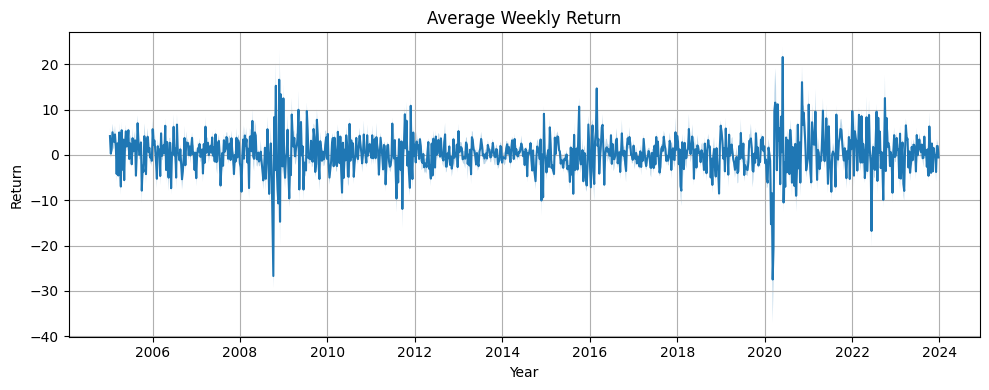

In [239]:
plot_avg_return_over_time(exam_df, oos_df)

In [8]:
import matplotlib.dates as mdates

def plot_return_per_stock(exam_df, oos_df):
    df_tmp = pd.concat([exam_df, oos_df], ignore_index=True)

    df_tmp = df_tmp.groupby(['PERMCO', 'From', 'To'])['Return'].first().reset_index()
    df_tmp = pd.merge(mkt_cap_df, df_tmp, on='PERMCO', how='inner')
    df_tmp['From'] = pd.to_datetime(df_tmp['From'])

    # Define the number of columns for subplots
    num_columns = 4
    unique_permcos = df_tmp['TICKER'].unique()
    num_permcos = len(unique_permcos)

    # Calculate number of rows needed based on the number of PERMCOs and desired columns
    num_rows = (num_permcos + num_columns - 1) // num_columns  # Ensures enough rows are included

    # Create a figure with subplots arranged into the desired number of rows and columns
    fig, axes = plt.subplots(nrows=num_rows, ncols=num_columns, figsize=(25, 2 * num_rows), sharex=False)

    # Flatten the axes array for easier iteration if it's multidimensional
    axes = axes.flatten()

    # Plot each PERMCO's data on a separate subplot
    for idx, permco in enumerate(unique_permcos[:]):
        permco_data = df_tmp[df_tmp['TICKER'] == permco]
        axes[idx].plot(permco_data['From'], permco_data['Return'], linestyle='-')
        axes[idx].set_title(permco)
        # axes[idx].set_ylabel('Number of Headlines')
        axes[idx].set_xticks(permco_data['From'])
        # Set the DateFormatter for the x-axis
        axes[idx].xaxis.set_major_formatter(mdates.DateFormatter('%Y'))  # Show only the year
        # Optionally, set the major locator if you want less frequent ticks
        axes[idx].xaxis.set_major_locator(mdates.YearLocator(2))
        axes[idx].grid(True)

        # # Rotate and align the tick labels so they look better
        # fig.autofmt_xdate()

    # Hide unused axes if there are any
    for ax in axes[idx + 1:]:
        ax.set_visible(False)

    # Set common labels
    plt.xlabel('')
    plt.tight_layout()
    plt.grid(True)  # Show grid
    plt.title('Comparative Weekly Return')
    plt.show()

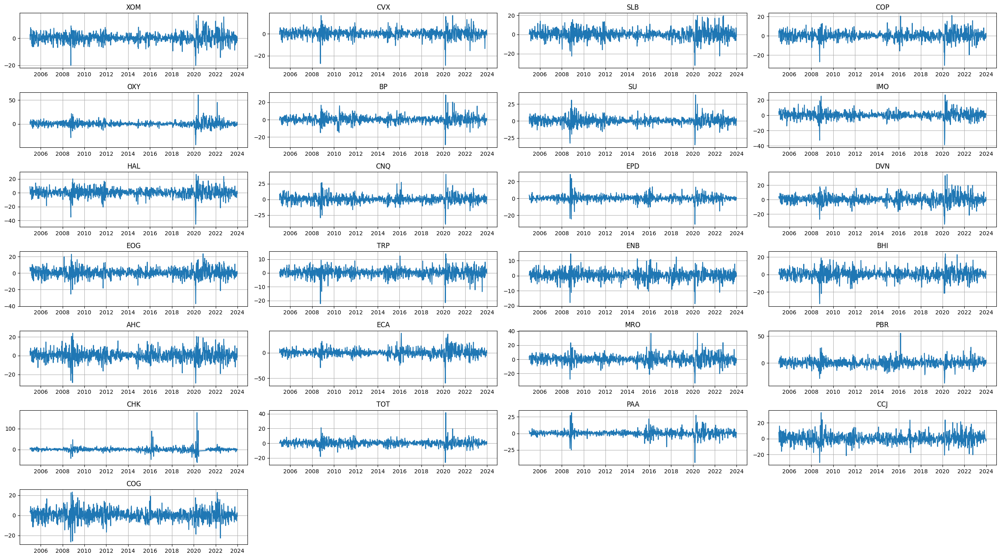

In [9]:
plot_return_per_stock(exam_df, oos_df)

In [248]:
## Table of stats of return by stock
df_tmp = pd.concat([exam_df, oos_df], ignore_index=True)
df_tmp = df_tmp.groupby(['PERMCO', 'From', 'To'])['Return'].first().reset_index()
df_tmp = df_tmp.groupby(['PERMCO'])['Return'].agg([np.sum, np.min, np.max, np.mean, np.std, 
                                                        lambda x: x.quantile(0.25), np.median, lambda x: x.quantile(0.75)]).reset_index()
df_tmp.columns = ['PERMCO', 'Sum', 'Min', 'Max', 'Mean', 'Std', 'Q1', 'Median', 'Q3']
df_tmp = pd.merge(mkt_cap_df[['PERMCO', 'TICKER']], df_tmp, on='PERMCO', how='inner')
df_tmp

C:\Users\User\AppData\Local\Temp\ipykernel_38636\1291397984.py:3: FutureWarning: The provided callable <function sum at 0x000002A8B67FA3E0> is currently using SeriesGroupBy.sum. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "sum" instead.
  df_tmp = df_tmp.groupby(['PERMCO'])['Return'].agg([np.sum, np.min, np.max, np.mean, np.std,
C:\Users\User\AppData\Local\Temp\ipykernel_38636\1291397984.py:3: FutureWarning: The provided callable <function min at 0x000002A8B67FAC00> is currently using SeriesGroupBy.min. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "min" instead.
  df_tmp = df_tmp.groupby(['PERMCO'])['Return'].agg([np.sum, np.min, np.max, np.mean, np.std,
C:\Users\User\AppData\Local\Temp\ipykernel_38636\1291397984.py:3: FutureWarning: The provided callable <function max at 0x000002A8B67FAAC0> is currently using SeriesGroupBy.max. In a future ve

,PERMCO,TICKER,Sum,Min,Max,Mean,Std,Q1,Median,Q3
0,20678,XOM,198.421633,-20.067169,16.736381,0.200832,3.455696,-1.563685,0.217354,1.988960
1,20440,CVX,259.627365,-28.806060,16.726724,0.262781,3.712786,-1.533596,0.296220,2.301670
2,21576,SLB,229.528498,-32.243192,19.847058,0.232316,5.178213,-2.459247,0.023903,3.134849
3,21401,COP,306.643335,-30.774373,21.137343,0.310368,4.589529,-2.077383,0.369381,2.716889
4,21322,OXY,308.894283,-43.557320,60.540757,0.312646,5.842259,-2.355459,0.118217,2.637989
5,20333,BP,145.200429,-29.055997,28.522141,0.146964,4.136225,-1.936433,0.077565,2.140250
6,29139,SU,285.198689,-35.143794,38.448371,0.288663,5.657598,-2.631329,0.289423,3.136219
7,20972,IMO,272.148861,-38.717361,26.715893,0.275454,4.868263,-2.262624,0.256703,2.755624
8,20868,HAL,291.226364,-45.294624,26.534658,0.294764,6.104350,-2.963253,0.170144,3.630865
9,37900,CNQ,438.016429,-39.641732,40.042136,0.443336,6.052825,-2.615444,0.394512,3.517746


In [ ]:
## Table of stats of return by stock
df_tmp = pd.concat([exam_df, oos_df], ignore_index=True)
df_tmp = df_tmp.groupby(['PERMCO', 'From', 'To'])['Return'].first().reset_index()
df_tmp = df_tmp.groupby(['PERMCO'])['Return'].agg([np.sum, np.min, np.max, np.mean, np.std, 
                                                        lambda x: x.quantile(0.25), np.median, lambda x: x.quantile(0.75)]).reset_index()
df_tmp.columns = ['PERMCO', 'Sum', 'Min', 'Max', 'Mean', 'Std', 'Q1', 'Median', 'Q3']
df_tmp = pd.merge(mkt_cap_df[['PERMCO', 'TICKER']], df_tmp, on='PERMCO', how='inner')
df_tmp

In [249]:
## Table of stats of return by stock
def table_stats_return_per_stock(exam_df, oos_df):
    df_tmp = pd.concat([exam_df, oos_df], ignore_index=True)
    df_tmp = df_tmp.groupby(['PERMCO', 'From', 'To'])['Return'].first().reset_index()
    df_tmp = df_tmp.groupby(['PERMCO'])['Return'].agg([np.sum, np.min, np.max, np.mean, np.std, 
                                                            lambda x: x.quantile(0.25), np.median, lambda x: x.quantile(0.75)]).reset_index()
    df_tmp.columns = ['PERMCO', 'Sum', 'Min', 'Max', 'Mean', 'Std', 'Q1', 'Median', 'Q3']
    df_tmp = pd.merge(mkt_cap_df[['PERMCO', 'TICKER']], df_tmp, on='PERMCO', how='inner')
    df_tmp.to_csv('./report_data/data_stats_return_per_stock.csv')

In [250]:
table_stats_return_per_stock(exam_df, oos_df)

C:\Users\User\AppData\Local\Temp\ipykernel_38636\1549356458.py:5: FutureWarning: The provided callable <function sum at 0x000002A8B67FA3E0> is currently using SeriesGroupBy.sum. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "sum" instead.
  df_tmp = df_tmp.groupby(['PERMCO'])['Return'].agg([np.sum, np.min, np.max, np.mean, np.std,
C:\Users\User\AppData\Local\Temp\ipykernel_38636\1549356458.py:5: FutureWarning: The provided callable <function min at 0x000002A8B67FAC00> is currently using SeriesGroupBy.min. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "min" instead.
  df_tmp = df_tmp.groupby(['PERMCO'])['Return'].agg([np.sum, np.min, np.max, np.mean, np.std,
C:\Users\User\AppData\Local\Temp\ipykernel_38636\1549356458.py:5: FutureWarning: The provided callable <function max at 0x000002A8B67FAAC0> is currently using SeriesGroupBy.max. In a future ve

In [251]:
## Table of stats of return by stock
def table_stats_return_per_stock_by_datatype(df_tmp, datatype):
    df_tmp = df_tmp.groupby(['PERMCO', 'From', 'To'])['Return'].first().reset_index()
    df_tmp = df_tmp.groupby(['PERMCO'])['Return'].agg([np.sum, np.min, np.max, np.mean, np.std, 
                                                            lambda x: x.quantile(0.25), np.median, lambda x: x.quantile(0.75)]).reset_index()
    df_tmp.columns = ['PERMCO', 'Sum', 'Min', 'Max', 'Mean', 'Std', 'Q1', 'Median', 'Q3']
    df_tmp = pd.merge(mkt_cap_df[['PERMCO', 'TICKER']], df_tmp, on='PERMCO', how='inner')
    df_tmp.to_csv(f'./report_data/data_stats_return_per_stock_{datatype}.csv')

In [252]:
table_stats_return_per_stock_by_datatype(exam_df, 'exam')
table_stats_return_per_stock_by_datatype(oos_df, 'oos')

C:\Users\User\AppData\Local\Temp\ipykernel_38636\1053506052.py:4: FutureWarning: The provided callable <function sum at 0x000002A8B67FA3E0> is currently using SeriesGroupBy.sum. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "sum" instead.
  df_tmp = df_tmp.groupby(['PERMCO'])['Return'].agg([np.sum, np.min, np.max, np.mean, np.std,
C:\Users\User\AppData\Local\Temp\ipykernel_38636\1053506052.py:4: FutureWarning: The provided callable <function min at 0x000002A8B67FAC00> is currently using SeriesGroupBy.min. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "min" instead.
  df_tmp = df_tmp.groupby(['PERMCO'])['Return'].agg([np.sum, np.min, np.max, np.mean, np.std,
C:\Users\User\AppData\Local\Temp\ipykernel_38636\1053506052.py:4: FutureWarning: The provided callable <function max at 0x000002A8B67FAAC0> is currently using SeriesGroupBy.max. In a future ve

In [13]:
import matplotlib.ticker as ticker

def plot_num_of_avail_text(exam_df, oos_df):
    ## number of unique available headlines in each week
    df_tmp = pd.concat([exam_df, oos_df], ignore_index=True)
    df_tmp.loc[df_tmp['Text'] == 'No_Headlines', 'Text'] = np.nan
    df_tmp = df_tmp.groupby(['From', 'To'])['Text'].nunique().reset_index()
    df_tmp['From'] = pd.to_datetime(df_tmp['To'])

    plt.figure(figsize=(10, 4))
    plt.plot(df_tmp['From'], df_tmp['Text'])
    plt.title('Number of Total Unique Headlines')
    plt.xlabel('Year')
    plt.ylabel('Number of Headline')
    plt.grid(True)

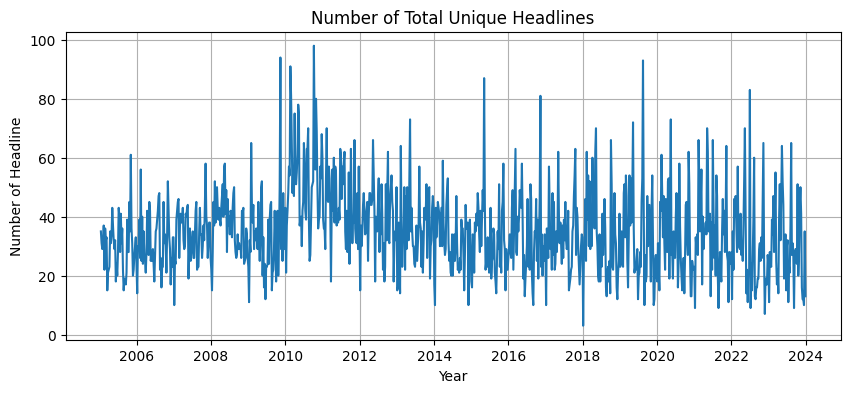

In [14]:
plot_num_of_avail_text(exam_df, oos_df)

In [68]:
def plot_num_of_avail_text_YearlySum(exam_df, oos_df):
    ## number of unique available headlines in each week
    df_tmp = pd.concat([exam_df, oos_df], ignore_index=True)
    df_tmp.loc[df_tmp['Text'] == 'No_Headlines', 'Text'] = np.nan
    df_tmp['Year'] = pd.to_datetime(df_tmp['From']).dt.year.astype(int)
    df_tmp = df_tmp.groupby(['Year'])['Text'].nunique().reset_index()

    # Calculate the average number of headlines
    avg_headlines = df_tmp['Text'].mean().astype(int)


    plt.figure(figsize=(10, 4))
    plt.bar(df_tmp['Year'], df_tmp['Text'])

    plt.axhline(y=avg_headlines, color='r', linestyle='--', label=f'Average Headlines = {avg_headlines:.2f}')
    
    # plt.title('Number of Unique Headlines')
    plt.xlabel('Year')
    plt.xticks(df_tmp['Year'].unique(), rotation=45)
    plt.ylabel('Number of Headline')
    # plt.grid(True)
    # plt.legend()
    # Adding text above the average line
    plt.text(x=2021, y=avg_headlines + 50,  # Adjust y position to be slightly above the line
             s=f'Average = {avg_headlines}', color='black')

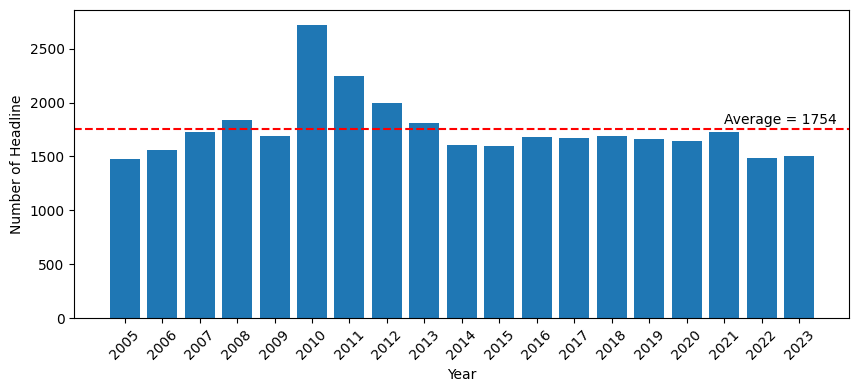

In [69]:
plot_num_of_avail_text_YearlySum(exam_df, oos_df)

In [82]:
df_tmp = exam_df.copy()
df_tmp.loc[df_tmp['Text'] == 'No_Headlines', 'Text'] = np.nan
df_tmp = df_tmp.groupby(['PERMCO', 'From', 'To'])['Text'].nunique().reset_index()
df_tmp = df_tmp[df_tmp['From'] == '2005-01-10']
df_tmp

,PERMCO,From,To,Text
0,2381,2005-01-10,2005-01-14,5
572,11937,2005-01-10,2005-01-14,0
1144,20064,2005-01-10,2005-01-14,0
1716,20253,2005-01-10,2005-01-14,2
2288,20333,2005-01-10,2005-01-14,6
2860,20440,2005-01-10,2005-01-14,1
3432,20678,2005-01-10,2005-01-14,3
4004,20868,2005-01-10,2005-01-14,4
4576,20972,2005-01-10,2005-01-14,1
5148,21322,2005-01-10,2005-01-14,0


In [149]:
def plot_text_per_stock(exam_df, oos_df):
    ## Check number of text per PERMCO
    df_tmp = pd.concat([exam_df, oos_df], ignore_index=True)
    df_tmp.loc[df_tmp['Text'] == 'No_Headlines', 'Text'] = np.nan
    df_tmp = df_tmp.groupby(['PERMCO', 'From', 'To'])['Text'].nunique().reset_index()
    df_tmp = df_tmp.groupby(['From', 'To'])['Text'].agg([np.mean, 
                                                        lambda x: x.quantile(0.25), 
                                                        lambda x: x.quantile(0.75),
                                                        np.min,
                                                        np.max]).reset_index()
    df_tmp.columns = ['From', 'To', 'mean', 'q1', 'q3', 'min', 'max']

    df_tmp['From'] = pd.to_datetime(df_tmp['To'])

    plt.figure(figsize=(10, 4))
    plt.plot(df_tmp['From'], df_tmp['mean'], label='Mean')
    # plt.plot(df_tmp['From'], df_tmp['min'], label='Min', alpha=0.3)
    # plt.plot(df_tmp['From'], df_tmp['max'], label='Max', alpha=0.3)


    # Fill between the 1st and 3rd quantile
    plt.fill_between(df_tmp['From'], df_tmp['q1'], df_tmp['q3'], alpha=0.3)
    plt.title('Average Number of Headlines per Stock')
    plt.xlabel('Year')
    plt.ylabel('Number of Headlines')
    plt.grid(True)
    # plt.legend()

C:\Users\User\AppData\Local\Temp\ipykernel_38636\3825799529.py:6: FutureWarning: The provided callable <function mean at 0x000002A8B67FB4C0> is currently using SeriesGroupBy.mean. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "mean" instead.
  df_tmp = df_tmp.groupby(['From', 'To'])['Text'].agg([np.mean,
C:\Users\User\AppData\Local\Temp\ipykernel_38636\3825799529.py:6: FutureWarning: The provided callable <function min at 0x000002A8B67FAC00> is currently using SeriesGroupBy.min. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "min" instead.
  df_tmp = df_tmp.groupby(['From', 'To'])['Text'].agg([np.mean,
C:\Users\User\AppData\Local\Temp\ipykernel_38636\3825799529.py:6: FutureWarning: The provided callable <function max at 0x000002A8B67FAAC0> is currently using SeriesGroupBy.max. In a future version of pandas, the provided callable will be used direc

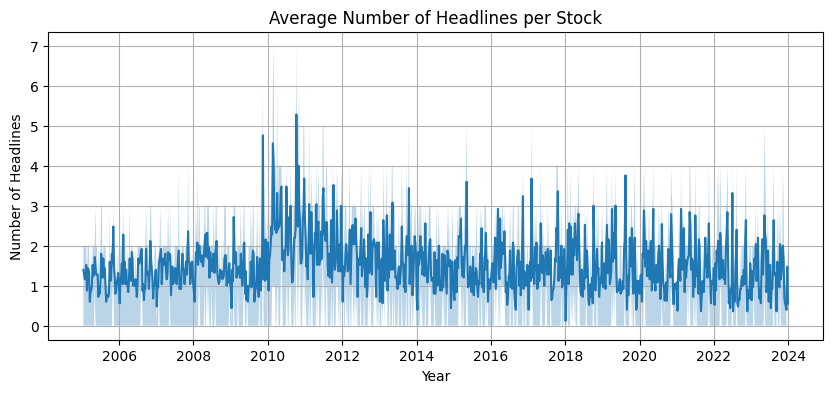

In [150]:
plot_text_per_stock(exam_df, oos_df)

In [31]:
def plot_text_per_stock_YearlyAvg(exam_df, oos_df):
    ## Check number of text per PERMCO
    df_tmp = pd.concat([exam_df, oos_df], ignore_index=True)
    df_tmp.loc[df_tmp['Text'] == 'No_Headlines', 'Text'] = np.nan
    df_tmp = df_tmp.groupby(['PERMCO', 'From', 'To'])['Text'].nunique().reset_index()
    df_tmp['Year'] = pd.to_datetime(df_tmp['From']).dt.year.astype(str)

    df_tmp = df_tmp.groupby(['Year'])['Text'].agg([np.mean, 
                                                    lambda x: x.quantile(0.25), 
                                                    lambda x: x.quantile(0.75),
                                                    np.min,
                                                    np.max]).reset_index()
    df_tmp.columns = ['Year', 'mean', 'q1', 'q3', 'min', 'max']


    # Calculate the average number of headlines
    avg_headlines = df_tmp['mean'].mean()
    

    plt.figure(figsize=(10, 4))
    plt.bar(df_tmp['Year'], df_tmp['mean'], label='Mean')
    # plt.plot(df_tmp['From'], df_tmp['min'], label='Min', alpha=0.3)
    # plt.plot(df_tmp['From'], df_tmp['max'], label='Max', alpha=0.3)
    plt.axhline(y=avg_headlines, color='r', linestyle='--', label=f'Average Headlines = {avg_headlines:.2f}')


    # Fill between the 1st and 3rd quantile
    # plt.fill_between(df_tmp['From'], df_tmp['q1'], df_tmp['q3'], alpha=0.3)
    # plt.title('Average Number of Headlines per Stock')
    plt.xlabel('Year')
    plt.ylabel('Number of Headlines')
    plt.xticks(df_tmp['Year'].unique(), rotation=45)
    # plt.grid(True)
    # plt.legend()
    
    # # Adding text above the average line
    # plt.text(x=2021, y=avg_headlines,  # Adjust y position to be slightly above the line
    #          s=f'Average = {avg_headlines}', color='black')

C:\Users\User\AppData\Local\Temp\ipykernel_3936\823958496.py:8: FutureWarning: The provided callable <function mean at 0x000002700E77F560> is currently using SeriesGroupBy.mean. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "mean" instead.
  df_tmp = df_tmp.groupby(['Year'])['Text'].agg([np.mean,
C:\Users\User\AppData\Local\Temp\ipykernel_3936\823958496.py:8: FutureWarning: The provided callable <function min at 0x000002700E77ECA0> is currently using SeriesGroupBy.min. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "min" instead.
  df_tmp = df_tmp.groupby(['Year'])['Text'].agg([np.mean,
C:\Users\User\AppData\Local\Temp\ipykernel_3936\823958496.py:8: FutureWarning: The provided callable <function max at 0x000002700E77EB60> is currently using SeriesGroupBy.max. In a future version of pandas, the provided callable will be used directly. To keep curre

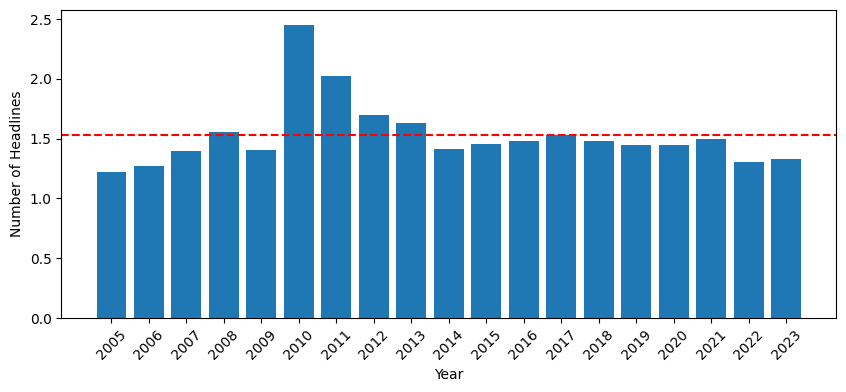

In [32]:
plot_text_per_stock_YearlyAvg(exam_df, oos_df)

In [99]:
## Check the statistic of number of headlines per stock
df_tmp = exam_df.copy()
df_tmp.loc[df_tmp['Text'] == 'No_Headlines', 'Text'] = np.nan
df_tmp = df_tmp.groupby(['PERMCO', 'From', 'To'])['Text'].nunique().reset_index()
df_tmp = df_tmp.groupby(['PERMCO'])['Text'].agg([np.sum, np.mean, np.std, 
                                                      lambda x: x.quantile(0.25), np.median, lambda x: x.quantile(0.75)]).reset_index()
df_tmp.columns = ['PERMCO', 'Sum', 'Mean', 'Std', 'Q1', 'Median', 'Q3']

df_tmp = pd.merge(mapper_df[['PERMCO', 'TICKER']], df_tmp, on='PERMCO', how='inner')
df_tmp.to_csv('./report_data/data_stat_headlines_per_stock')

C:\Users\User\AppData\Local\Temp\ipykernel_38636\2210655350.py:5: FutureWarning: The provided callable <function sum at 0x000002A8B67FA3E0> is currently using SeriesGroupBy.sum. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "sum" instead.
  df_tmp = df_tmp.groupby(['PERMCO'])['Text'].agg([np.sum, np.mean, np.std,
C:\Users\User\AppData\Local\Temp\ipykernel_38636\2210655350.py:5: FutureWarning: The provided callable <function mean at 0x000002A8B67FB4C0> is currently using SeriesGroupBy.mean. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "mean" instead.
  df_tmp = df_tmp.groupby(['PERMCO'])['Text'].agg([np.sum, np.mean, np.std,
C:\Users\User\AppData\Local\Temp\ipykernel_38636\2210655350.py:5: FutureWarning: The provided callable <function std at 0x000002A8B67FB600> is currently using SeriesGroupBy.std. In a future version of pandas, the provided cal

In [137]:
def table_stat_headlines_per_stock(exam_df, oos_df):
    ## Check the statistic of number of headlines per stock
    df_tmp = pd.concat([exam_df, oos_df], ignore_index=True)
    df_tmp.loc[df_tmp['Text'] == 'No_Headlines', 'Text'] = np.nan
    df_tmp = df_tmp.groupby(['PERMCO', 'From', 'To'])['Text'].nunique().reset_index()
    df_tmp = df_tmp.groupby(['PERMCO'])['Text'].agg([np.sum, np.min, np.max, np.mean, np.std, 
                                                        lambda x: x.quantile(0.25), np.median, lambda x: x.quantile(0.75)]).reset_index()
    df_tmp.columns = ['PERMCO', 'Sum', 'Min', 'Max', 'Mean', 'Std', 'Q1', 'Median', 'Q3']

    df_tmp = pd.merge(mapper_df[['PERMCO', 'TICKER']], df_tmp, on='PERMCO', how='inner')
    df_tmp.to_csv('./report_data/data_stat_headlines_per_stock', index=False)

<Axes: xlabel='TICKER'>

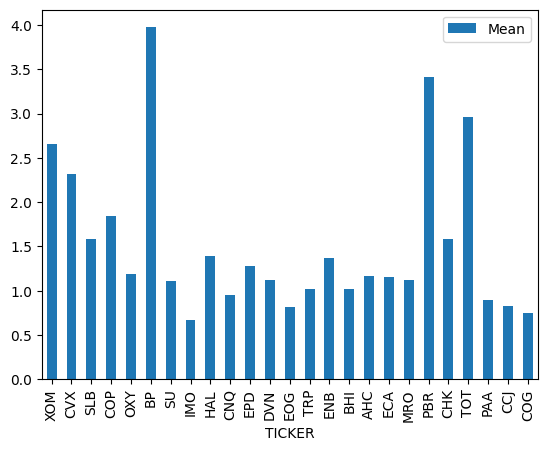

In [13]:
df_tmp = pd.read_csv('./report_data/data_stat_headlines_per_stock')
df_tmp = pd.merge(mkt_cap_df[['PERMCO']], df_tmp, on='PERMCO', how='inner')
df_tmp.plot.bar(x='TICKER', y='Mean')

In [138]:
table_stat_headlines_per_stock(exam_df, oos_df)

C:\Users\User\AppData\Local\Temp\ipykernel_38636\3080067160.py:6: FutureWarning: The provided callable <function sum at 0x000002A8B67FA3E0> is currently using SeriesGroupBy.sum. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "sum" instead.
  df_tmp = df_tmp.groupby(['PERMCO'])['Text'].agg([np.sum, np.min, np.max, np.mean, np.std,
C:\Users\User\AppData\Local\Temp\ipykernel_38636\3080067160.py:6: FutureWarning: The provided callable <function min at 0x000002A8B67FAC00> is currently using SeriesGroupBy.min. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "min" instead.
  df_tmp = df_tmp.groupby(['PERMCO'])['Text'].agg([np.sum, np.min, np.max, np.mean, np.std,
C:\Users\User\AppData\Local\Temp\ipykernel_38636\3080067160.py:6: FutureWarning: The provided callable <function max at 0x000002A8B67FAAC0> is currently using SeriesGroupBy.max. In a future versio

In [255]:
def table_stat_headlines_per_stock_by_datatype(df_tmp, data_type):
    ## Check the statistic of number of headlines per stock
    df_tmp.loc[df_tmp['Text'] == 'No_Headlines', 'Text'] = np.nan
    df_tmp = df_tmp.groupby(['PERMCO', 'From', 'To'])['Text'].nunique().reset_index()
    df_tmp = df_tmp.groupby(['PERMCO'])['Text'].agg([np.sum, np.min, np.max, np.mean, np.std, 
                                                        lambda x: x.quantile(0.25), np.median, lambda x: x.quantile(0.75)]).reset_index()
    df_tmp.columns = ['PERMCO', 'Sum', 'Min', 'Max', 'Mean', 'Std', 'Q1', 'Median', 'Q3']

    df_tmp = pd.merge(mkt_cap_df[['PERMCO', 'TICKER']], df_tmp, on='PERMCO', how='inner')
    df_tmp.to_csv(f'./report_data/data_stats_headlines_per_stock_{data_type}.csv', index=False)

In [256]:
table_stat_headlines_per_stock_by_datatype(exam_df, data_type='exam')
table_stat_headlines_per_stock_by_datatype(oos_df, data_type='oos')

C:\Users\User\AppData\Local\Temp\ipykernel_38636\526925377.py:5: FutureWarning: The provided callable <function sum at 0x000002A8B67FA3E0> is currently using SeriesGroupBy.sum. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "sum" instead.
  df_tmp = df_tmp.groupby(['PERMCO'])['Text'].agg([np.sum, np.min, np.max, np.mean, np.std,
C:\Users\User\AppData\Local\Temp\ipykernel_38636\526925377.py:5: FutureWarning: The provided callable <function min at 0x000002A8B67FAC00> is currently using SeriesGroupBy.min. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "min" instead.
  df_tmp = df_tmp.groupby(['PERMCO'])['Text'].agg([np.sum, np.min, np.max, np.mean, np.std,
C:\Users\User\AppData\Local\Temp\ipykernel_38636\526925377.py:5: FutureWarning: The provided callable <function max at 0x000002A8B67FAAC0> is currently using SeriesGroupBy.max. In a future version o

In [147]:
df_tmp = exam_df.copy()
df_tmp.loc[df_tmp['Text'] == 'No_Headlines', 'Text'] = np.nan
df_tmp = df_tmp.groupby(['PERMCO', 'From', 'To'])['Text'].nunique().reset_index()
df_tmp

,PERMCO,From,To,Text
0,2381,2005-01-10,2005-01-14,5
1,2381,2005-01-17,2005-01-21,1
2,2381,2005-01-24,2005-01-28,0
3,2381,2005-01-31,2005-02-04,0
4,2381,2005-02-07,2005-02-11,1
...,...,...,...,...
14295,42001,2015-11-23,2015-11-27,2
14296,42001,2015-11-30,2015-12-04,0
14297,42001,2015-12-07,2015-12-11,1
14298,42001,2015-12-14,2015-12-18,0


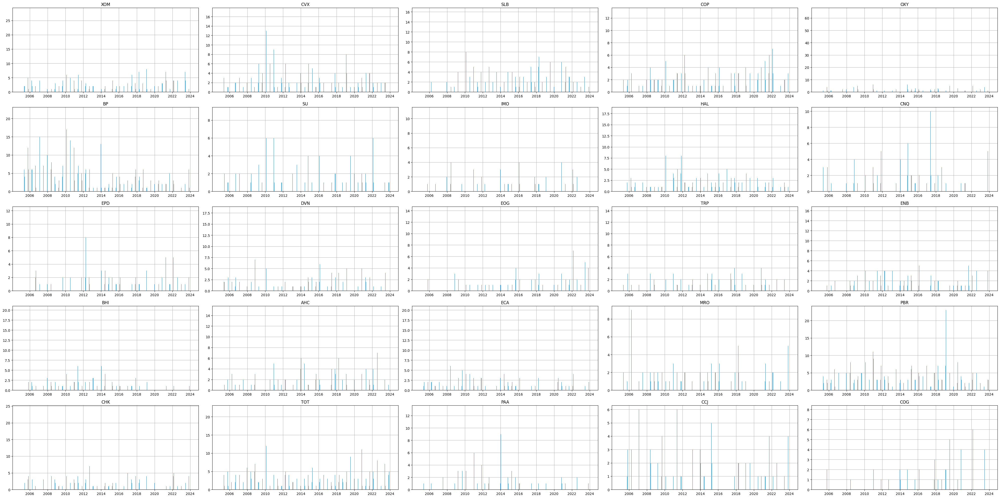

In [11]:
import matplotlib.dates as mdates

df_tmp = pd.concat([exam_df, oos_df], ignore_index=True)

df_tmp.loc[df_tmp['Text'] == 'No_Headlines', 'Text'] = np.nan
df_tmp = df_tmp.groupby(['PERMCO', 'From', 'To'])['Text'].nunique().reset_index()

df_tmp['From'] = pd.to_datetime(df_tmp['From'])
df_tmp.sort_values(by=['PERMCO', 'From'], inplace=True)
df_tmp = pd.merge(mkt_cap_df[['PERMCO', 'TICKER']], df_tmp, on='PERMCO', how='inner')

# Define the number of columns for subplots
num_columns = 5
unique_permcos = df_tmp['PERMCO'].unique()
num_permcos = len(unique_permcos)

# Calculate number of rows needed based on the number of PERMCOs and desired columns
num_rows = (num_permcos + num_columns - 1) // num_columns  # Ensures enough rows are included

# Create a figure with subplots arranged into the desired number of rows and columns
fig, axes = plt.subplots(nrows=num_rows, ncols=num_columns, figsize=(40, 4 * num_rows), sharex=False)

# Flatten the axes array for easier iteration if it's multidimensional
axes = axes.flatten()

# Plot each PERMCO's data on a separate subplot
for idx, permco in enumerate(unique_permcos[:]):
    permco_data = df_tmp[df_tmp['PERMCO'] == permco]
    ticker = permco_data['TICKER'].values[0]
    axes[idx].bar(permco_data['From'], permco_data['Text'], linestyle='-')
    axes[idx].set_title(ticker)
    # axes[idx].set_ylabel('Number of Headlines')
    axes[idx].set_xticks(permco_data['From'])
    # Set the DateFormatter for the x-axis
    axes[idx].xaxis.set_major_formatter(mdates.DateFormatter('%Y'))  # Show only the year
    # Optionally, set the major locator if you want less frequent ticks
    axes[idx].xaxis.set_major_locator(mdates.YearLocator(2))
    axes[idx].grid(True)

# Hide unused axes if there are any
for ax in axes[idx + 1:]:
    ax.set_visible(False)

# Set common labels
plt.xlabel('')
plt.tight_layout()
# plt.grid(True)
plt.show()

In [268]:
import matplotlib.dates as mdates

def plot_num_of_headlines_each_stock(exam_df, oos_df):
    df_tmp = pd.concat([exam_df, oos_df], ignore_index=True)

    df_tmp.loc[df_tmp['Text'] == 'No_Headlines', 'Text'] = np.nan
    df_tmp = df_tmp.groupby(['PERMCO', 'From', 'To'])['Text'].nunique().reset_index()

    df_tmp['From'] = pd.to_datetime(df_tmp['From'])
    df_tmp.sort_values(by=['PERMCO', 'From'], inplace=True)
    df_tmp = pd.merge(mkt_cap_df[['PERMCO', 'TICKER']], df_tmp, on='PERMCO', how='inner')

    # Define the number of columns for subplots
    num_columns = 5
    unique_permcos = df_tmp['PERMCO'].unique()
    num_permcos = len(unique_permcos)

    # Calculate number of rows needed based on the number of PERMCOs and desired columns
    num_rows = (num_permcos + num_columns - 1) // num_columns  # Ensures enough rows are included

    # Create a figure with subplots arranged into the desired number of rows and columns
    fig, axes = plt.subplots(nrows=num_rows, ncols=num_columns, figsize=(40, 4 * num_rows), sharex=False)

    # Flatten the axes array for easier iteration if it's multidimensional
    axes = axes.flatten()

    # Plot each PERMCO's data on a separate subplot
    for idx, permco in enumerate(unique_permcos[:]):
        permco_data = df_tmp[df_tmp['PERMCO'] == permco]
        ticker = permco_data['TICKER'].values[0]
        axes[idx].plot(permco_data['From'], permco_data['Text'], linestyle='-')
        axes[idx].set_title(ticker)
        # axes[idx].set_ylabel('Number of Headlines')
        axes[idx].set_xticks(permco_data['From'])
        # Set the DateFormatter for the x-axis
        axes[idx].xaxis.set_major_formatter(mdates.DateFormatter('%Y'))  # Show only the year
        # Optionally, set the major locator if you want less frequent ticks
        axes[idx].xaxis.set_major_locator(mdates.YearLocator(2))
        axes[idx].grid(True)

    # Hide unused axes if there are any
    for ax in axes[idx + 1:]:
        ax.set_visible(False)

    # Set common labels
    plt.xlabel('')
    plt.tight_layout()
    # plt.grid(True)
    plt.show()

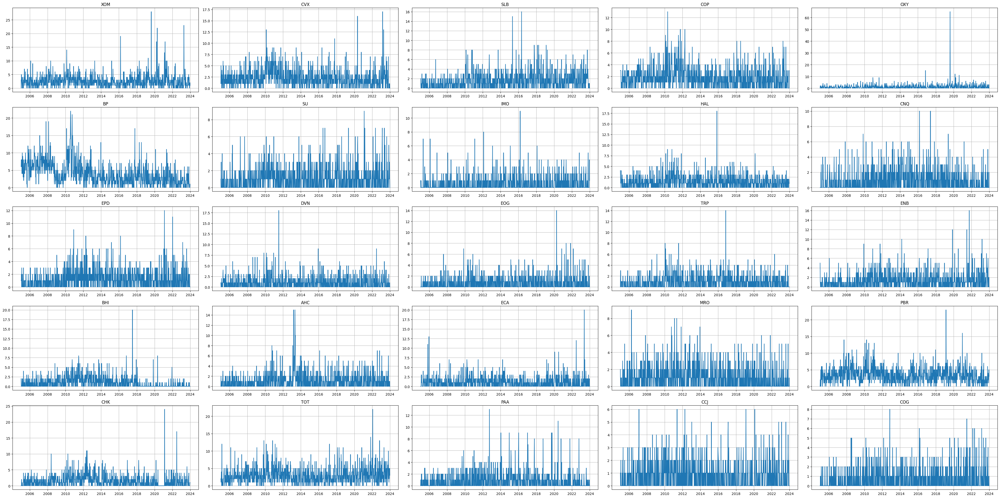

In [269]:
plot_num_of_headlines_each_stock(exam_df, oos_df)

# Word Cloud

In [10]:
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from wordcloud import WordCloud, STOPWORDS

In [11]:
nltk.download('punkt')
nltk.download('stopwords')

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\User\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\User\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [12]:
cmpn_nm_df = pd.read_csv('exam_period_v6.csv')
cmpn_nm_df = cmpn_nm_df['COMNAM'].dropna().drop_duplicates()
cmpn_nm = ' '.join(x.lower() for x in cmpn_nm_df).split()
# cmpn_nm = ' '.join(x for x in cmpn_nm_df).split()
# cmpn_nm

C:\Users\User\AppData\Local\Temp\ipykernel_7716\4177081088.py:1: DtypeWarning: Columns (9,22,24,49,57) have mixed types. Specify dtype option on import or set low_memory=False.
  cmpn_nm_df = pd.read_csv('exam_period_v6.csv')


In [13]:
cmpn_nm_df = pd.read_csv('KeyDev_top25_11Jun2024_1546.csv')
# cmpn_nm_df
cmpn_nm_df = cmpn_nm_df['companyname'].dropna().drop_duplicates()
cmpn_nm2 = ' '.join(x.lower() for x in cmpn_nm_df).split()
# cmpn_nm2 = ' '.join(x for x in cmpn_nm_df).split()
# cmpn_nm

In [14]:
# cmpn_nm.extend(cmpn_nm2)
# cmpn_nm = list(set(cmpn_nm))
# cmpn_nm[:30]

In [15]:
# a = ' '.join(set(x.lower() for x in mkt_cap_df['companyname'].drop_duplicates())).split()

In [15]:
company_names = [
    "Exxon Mobil",
    "Chevron",
    "Halliburton",
    "ConocoPhillips",
    "Suncor Energy",
    "Imperial Oil",
    "Hess Corporation",
    "Schlumberger",
    "Enbridge",
    "Marathon Oil",
    "Devon Energy",
    "Canadian Natural Resources",
    "EOG Resources",
    "Baker Hughes",
    "Chesapeake Energy",
    "Enterprise Products Partners",
    "Occidental Petroleum",
    "Petrobras",  # Short for Petroleo Brasileiro
    "Petroleo Brasileiro",
    "TransCanada Corp"
]
company_names_stop_words = ' '.join(x.lower() for x in company_names).split()
company_names_stop_words = [x for x in company_names_stop_words if x not in 
                            ["oil", "energy", "natural", "resources", "products", "partners", "petroleum"]]
company_names_stop_words += ['bp', 'plc']
company_names_stop_words

['exxon',
 'mobil',
 'chevron',
 'halliburton',
 'conocophillips',
 'suncor',
 'imperial',
 'hess',
 'corporation',
 'schlumberger',
 'enbridge',
 'marathon',
 'devon',
 'canadian',
 'eog',
 'baker',
 'hughes',
 'chesapeake',
 'enterprise',
 'occidental',
 'petrobras',
 'petroleo',
 'brasileiro',
 'transcanada',
 'corp',
 'bp',
 'plc']

In [22]:
## Generate word cloud
def plot_word_cloud(df_tmp):
    df_tmp = df_tmp[['PERMCO', 'Text']]
    df_tmp.loc[df_tmp['Text'] == 'No_Headlines', 'Text'] = ''
    df_tmp.loc[df_tmp['Text'].isna(), 'Text'] = ''


    ## Set of stopwords
    stop_words = set(stopwords.words('english'))

    additional_stop_words = company_names_stop_words
    stop_words.update(additional_stop_words)

    ## Tokenize and remove stopwords
    def tokenize_and_remove_stopwords(text):
        ## Tokenize the text
        tokens = word_tokenize(str(text))
        ## Remove stopwords and non-alphabetic tokens
        filtered_tokens = [word.lower().strip() for word in tokens if word.lower().strip() not in stop_words and word.isalpha()]
        return filtered_tokens

    df_tmp['tokens_nltk'] = df_tmp['Text'].apply(tokenize_and_remove_stopwords)

    ## Concat all text from Text column
    all_text = " ".join(text for text in df_tmp['tokens_nltk'].dropna().sum())

    ## Generate word cloud
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate(all_text)

    ## Display the generated word cloud image
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')  # Do not show axes to keep it clean
    plt.show()

C:\Users\User\AppData\Local\Temp\ipykernel_3936\1245069939.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_tmp['tokens_nltk'] = df_tmp['Text'].apply(tokenize_and_remove_stopwords)


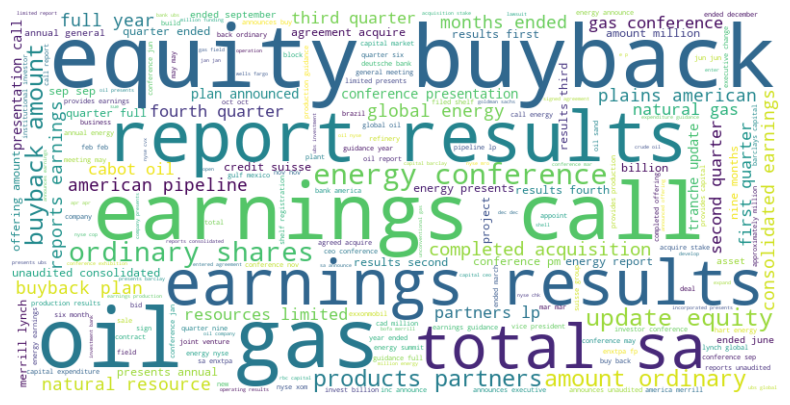

In [49]:
plot_word_cloud(exam_df)

C:\Users\User\AppData\Local\Temp\ipykernel_3936\1245069939.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_tmp['tokens_nltk'] = df_tmp['Text'].apply(tokenize_and_remove_stopwords)


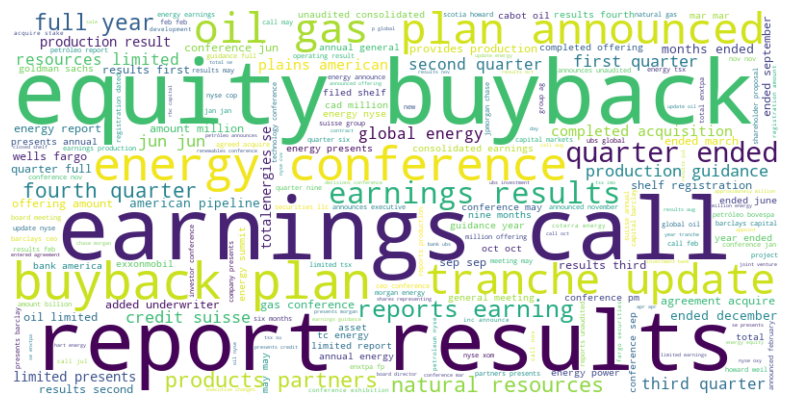

In [50]:
plot_word_cloud(oos_df)

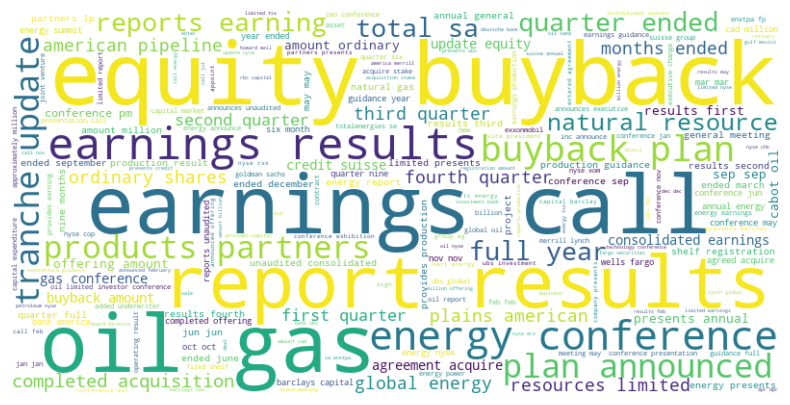

In [51]:
plot_word_cloud(pd.concat([exam_df, oos_df], ignore_index=False))

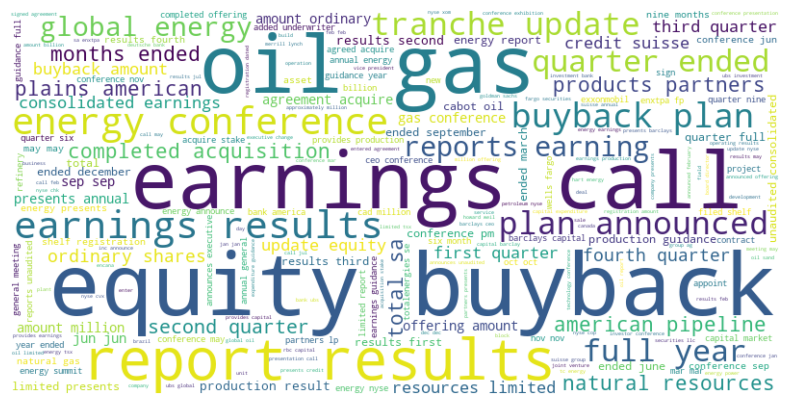

In [23]:
tmp_for_wc = pd.concat([exam_df, oos_df])
plot_word_cloud(tmp_for_wc[tmp_for_wc['moving_prc_dir'] == 0])

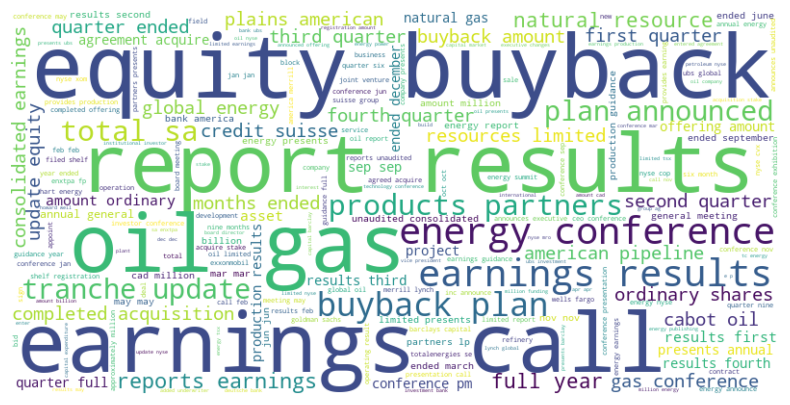

In [24]:
tmp_for_wc = pd.concat([exam_df, oos_df])
plot_word_cloud(tmp_for_wc[tmp_for_wc['moving_prc_dir'] == 1])

In [34]:
from collections import Counter

## Tokenize and remove stopwords
def tokenize_and_remove_stopwords(text):
    ## Tokenize the text
    tokens = word_tokenize(str(text))
    ## Remove stopwords and non-alphabetic tokens
    filtered_tokens = [word.lower().strip() for word in tokens if word.lower().strip() not in stop_words and word.isalpha()]
    return filtered_tokens

df_tmp = exam_df.copy()
df_tmp = df_tmp[['PERMCO', 'Text', 'moving_prc_dir']]
df_tmp.loc[df_tmp['Text'] == 'No_Headlines', 'Text'] = ''
df_tmp.loc[df_tmp['Text'].isna(), 'Text'] = ''

## Set of stopwords
stop_words = set(stopwords.words('english'))

additional_stop_words = company_names_stop_words
stop_words.update(additional_stop_words)

df_tmp['tokens_nltk'] = df_tmp['Text'].apply(tokenize_and_remove_stopwords)

## Concat all text from Text column
all_text_neg = [word for sublist in df_tmp[df_tmp['moving_prc_dir'] == 0]['tokens_nltk'].dropna() for word in sublist]
word_frequencies_neg = Counter(all_text_neg)

all_text_pos = [word for sublist in df_tmp[df_tmp['moving_prc_dir'] == 1]['tokens_nltk'].dropna() for word in sublist]
word_frequencies_pos = Counter(all_text_pos)

In [52]:
# word_only_in_neg = {word: freq for word, freq in word_frequencies_neg.items() if word not in word_frequencies_pos}
# word_only_in_pos = {word: freq for word, freq in word_frequencies_pos.items() if word not in word_frequencies_neg}

# word_only_in_neg = word_frequencies_neg - word_frequencies_pos
# word_only_in_pos = word_frequencies_pos - word_frequencies_neg

word_only_in_neg = word_frequencies_neg
word_only_in_pos = word_frequencies_pos


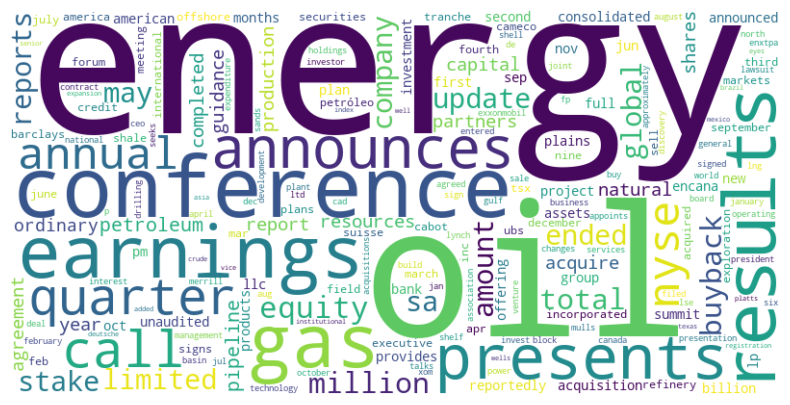

In [53]:
## Generate word cloud
wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(word_only_in_neg)

## Display the generated word cloud image
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')  # Do not show axes to keep it clean
plt.show()

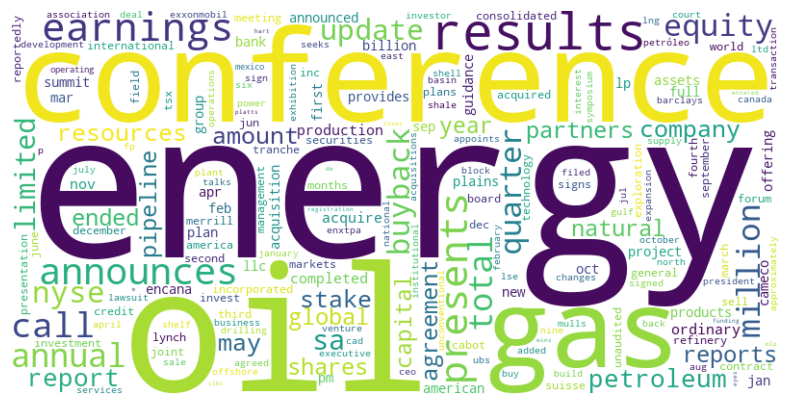

In [54]:
## Generate word cloud
wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(word_only_in_pos)

## Display the generated word cloud image
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')  # Do not show axes to keep it clean
plt.show()

In [447]:
def plot_word_cloud_by_ticker(exam_df, oos_df):
    
    def preprocess_for_wordcloud(df_tmp):

        df_tmp = df_tmp[['PERMCO', 'Text']]
        df_tmp.loc[df_tmp['Text'] == 'No_Headlines', 'Text'] = ''
        df_tmp.loc[df_tmp['Text'].isna(), 'Text'] = ''
        df_tmp = pd.merge(mkt_cap_df[['PERMCO', 'TICKER']], df_tmp, on='PERMCO', how='inner')

        ## Set of stopwords
        stop_words = set(stopwords.words('english'))

        additional_stop_words = company_names_stop_words
        stop_words.update(additional_stop_words)

        ## Tokenize and remove stopwords
        def tokenize_and_remove_stopwords(text):
            ## Tokenize the text
            tokens = word_tokenize(str(text))
            ## Remove stopwords and non-alphabetic tokens
            filtered_tokens = [word.lower().strip() for word in tokens if word.lower().strip() not in stop_words and word.isalpha()]
            return filtered_tokens

        df_tmp['tokens_nltk'] = df_tmp['Text'].apply(tokenize_and_remove_stopwords)

        return df_tmp

    exam_df = preprocess_for_wordcloud(exam_df)
    oos_df = preprocess_for_wordcloud(oos_df)


    # Define the number of columns for subplots
    num_columns = 2
    unique_permcos = exam_df['PERMCO'].unique()
    num_permcos = len(unique_permcos)

    # Calculate number of rows needed based on the number of PERMCOs and desired columns
    num_rows = num_permcos

    # Create a figure with subplots arranged into the desired number of rows and columns
    fig, axes = plt.subplots(nrows=num_rows, ncols=num_columns, figsize=(5, 2 * num_rows), sharex=False)
    fig.subplots_adjust(wspace=0.1, hspace=-0.85)

    # Plot each PERMCO's data on a separate subplot
    for idx, permco in enumerate(unique_permcos[:]):

        # print(row, col)

        exam_data = exam_df[exam_df['PERMCO'] == permco]
        ticker = exam_data['TICKER'].values[0]

        oos_data = oos_df[oos_df['PERMCO'] == permco]

        ## Concat all text from Text column
        all_text_exam = " ".join(text for text in exam_data['tokens_nltk'].dropna().sum())
        ## Generate word cloud
        wordcloud_exam = WordCloud(width=800, height=400, background_color='white').generate(all_text_exam)
        ## Display the generated word cloud image
        axes[idx, 0].imshow(wordcloud_exam, interpolation='bilinear')
        axes[idx, 0].axis('off')  # Do not show axes to keep it clean
        axes[idx, 0].set_title(ticker, fontsize=7)


        ## Concat all text from Text column
        all_text_oos = " ".join(text for text in oos_data['tokens_nltk'].dropna().sum())
        ## Generate word cloud
        wordcloud_oos = WordCloud(width=800, height=400, background_color='white').generate(all_text_oos)
        ## Display the generated word cloud image
        axes[idx, 1].imshow(wordcloud_oos, interpolation='bilinear')
        axes[idx, 1].axis('off')  # Do not show axes to keep it clean
        axes[idx, 1].set_title(ticker, fontsize=7)


    # Hide unused axes if there are any
    for ax in axes[idx + 1:]:
        ax.set_visible(False)

    # Set common labels
    plt.show()

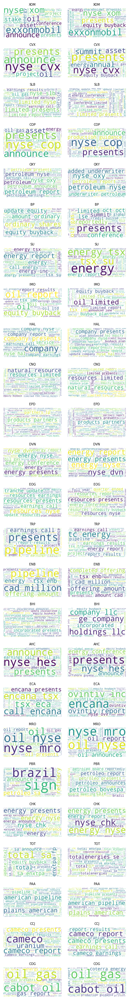

In [448]:
plot_word_cloud_by_ticker(exam_df, oos_df)

In [18]:
def plot_word_cloud_by_year(df_tmp):
    df_tmp = df_tmp[['Text', 'From']]
    df_tmp.loc[df_tmp['Text'] == 'No_Headlines', 'Text'] = ''
    df_tmp.loc[df_tmp['Text'].isna(), 'Text'] = ''
    df_tmp = df_tmp.drop_duplicates()

    df_tmp['Year'] = pd.to_datetime(df_tmp['From']).dt.year

    # Define stopwords
    stop_words = set(stopwords.words('english'))
    additional_stop_words = company_names_stop_words
    stop_words.update(additional_stop_words)

    # Tokenize and remove stopwords
    def tokenize_and_remove_stopwords(text):
        tokens = word_tokenize(str(text))
        return [word.lower().strip() for word in tokens if word.lower().strip() not in stop_words and word.isalpha()]

    df_tmp['tokens_nltk'] = df_tmp['Text'].apply(tokenize_and_remove_stopwords)

    # Define subplot grid
    num_columns = 3
    unique_years = sorted(df_tmp['Year'].unique())
    num_rows = (len(unique_years) + num_columns - 1) // num_columns  # Ensure enough rows

    fig, axes = plt.subplots(nrows=num_rows, ncols=num_columns, figsize=(15, num_rows * 3))
    fig.subplots_adjust(hspace=0, wspace=0.05)  # Adjust spacing

    axes = axes.flatten()

    for idx, year in enumerate(unique_years):
        all_text = " ".join(text for text in df_tmp[df_tmp['Year']==year]['tokens_nltk'].dropna().sum())
        wordcloud = WordCloud(width=800, height=400, background_color='white').generate(all_text)

        axes[idx].imshow(wordcloud, interpolation='bilinear')
        axes[idx].axis('off')
        axes[idx].set_title(str(year), fontsize=10)

    # Hide unused axes
    for ax in axes[idx + 1:]:
        ax.set_visible(False)

    plt.show()

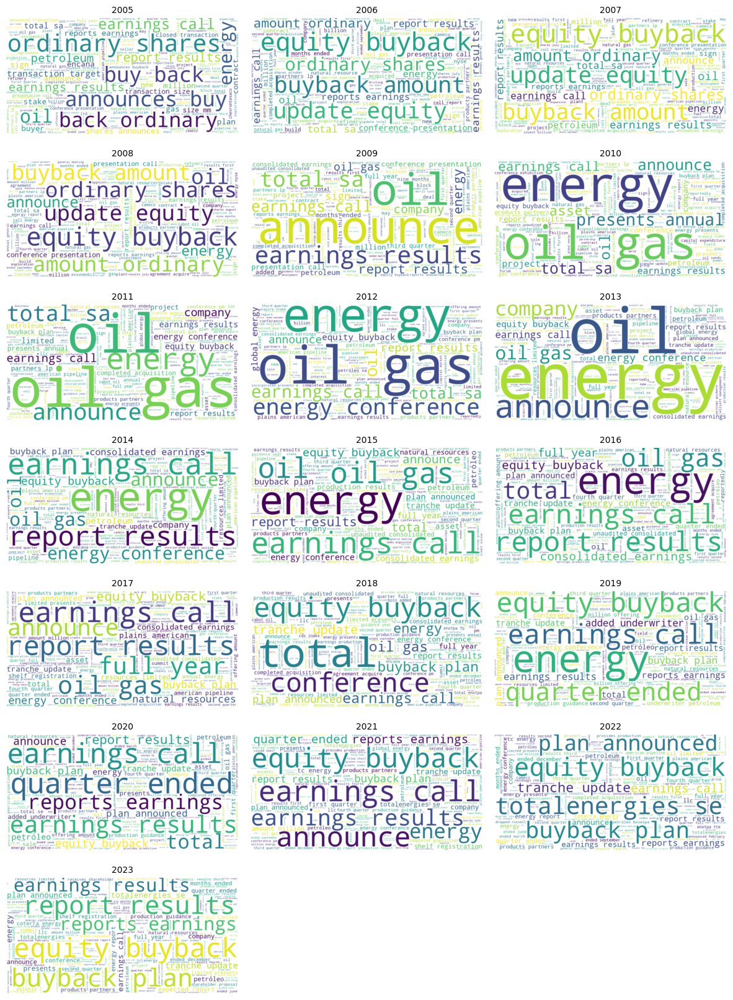

In [19]:
plot_word_cloud_by_year(pd.concat([exam_df, oos_df], ignore_index=False))